# Import library & Reading data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

In [2]:
train_df = pd.read_csv('Train.csv')

In [3]:
train_df.head()

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1


In [4]:
train_df.tail()

,text,label
39995,"""Western Union"" is something of a forgotten cl...",1
39996,This movie is an incredible piece of work. It ...,1
39997,My wife and I watched this movie because we pl...,0
39998,"When I first watched Flatliners, I was amazed....",1
39999,"Why would this film be so good, but only gross...",1


In [5]:
train_df.shape

(40000, 2)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    40000 non-null  object
 1   label   40000 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 625.1+ KB


In [7]:
train_df.isnull().sum()

text     0
label    0
dtype: int64

In [8]:
train_df.duplicated().sum()

277

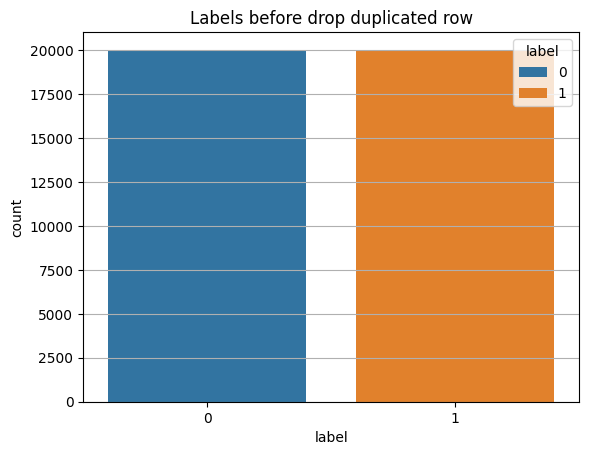

In [9]:
plt.grid()
sns.countplot(x=train_df['label'], hue=train_df['label'])
plt.title('Labels before drop duplicated row')
plt.show()

In [10]:
train_df.drop_duplicates(inplace = True)

In [11]:
train_df.reset_index(inplace=True)

In [12]:
train_df.drop('index', inplace = True, axis = 1)

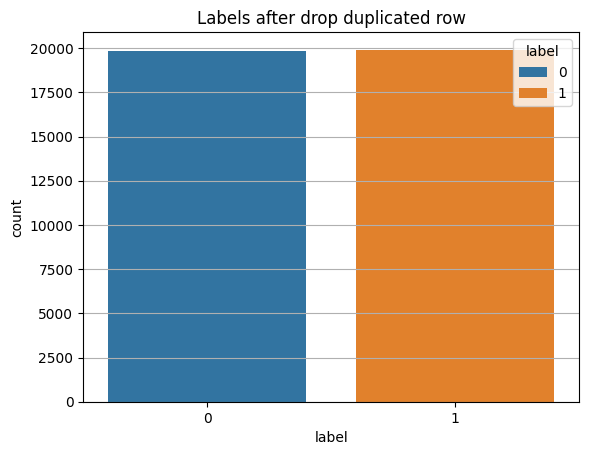

In [13]:
plt.grid()
sns.countplot(x=train_df['label'], hue=train_df['label'])
plt.title('Labels after drop duplicated row')
plt.show()

*********************************************************************************************

# Data Cleaning and Preprcessing

                                                        Convert all the data to lower case

In [14]:
train_df = train_df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

In [15]:
train_df.head()

,text,label
0,i grew up (b. 1965) watching and loving the th...,0
1,"when i put this movie in my dvd player, and sa...",0
2,why do people who do not know what a particula...,0
3,even though i have great interest in biblical ...,0
4,im a die hard dads army fan and nothing will e...,1


                                                    Plot the most common word for eac class

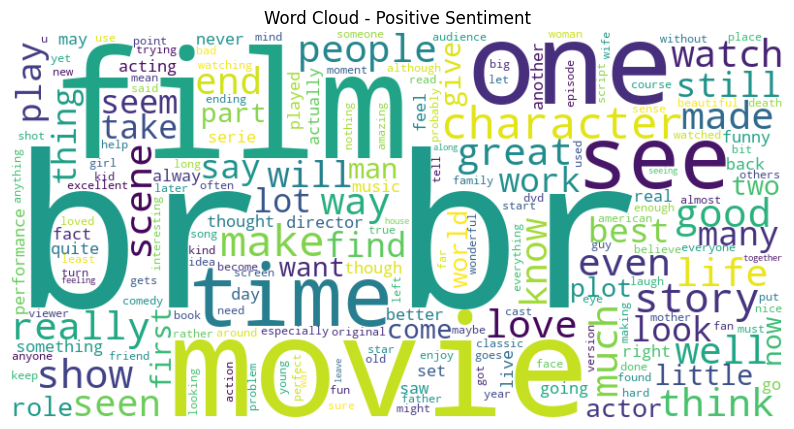

In [16]:
from wordcloud import WordCloud

positive_tweets = train_df[train_df['label'] == 1]['text']

positive_text = ' '.join(positive_tweets)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(positive_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Positive Sentiment')
plt.show()

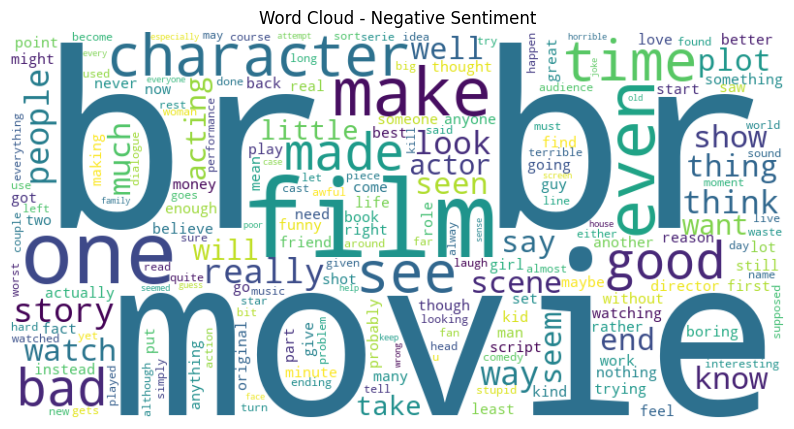

In [17]:

negative_tweets = train_df[train_df['label'] == 0]['text']

negative_text = ' '.join(negative_tweets)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Negative Sentiment')
plt.show()

                                                            Take a look to first 3 rows

In [18]:
for i in range(3):
  display(train_df['text'][i])

'i grew up (b. 1965) watching and loving the thunderbirds. all my mates at school watched. we played "thunderbirds" before school, during lunch and after school. we all wanted to be virgil or scott. no one wanted to be alan. counting down from 5 became an art form. i took my children to see the movie hoping they would get a glimpse of what i loved as a child. how bitterly disappointing. the only high point was the snappy theme tune. not that it could compare with the original score of the thunderbirds. thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created. jonatha frakes should hand in his directors chair, his version was completely hopeless. a waste of film. utter rubbish. a cgi remake may be acceptable but replacing marionettes with homo sapiens subsp. sapiens was a huge error of judgment.'

"when i put this movie in my dvd player, and sat down with a coke and some chips, i had some expectations. i was hoping that this movie would contain some of the strong-points of the first movie: awsome animation, good flowing story, excellent voice cast, funny comedy and a kick-ass soundtrack. but, to my disappointment, not any of this is to be found in atlantis: milo's return. had i read some reviews first, i might not have been so let down. the following paragraph will be directed to those who have seen the first movie, and who enjoyed it primarily for the points mentioned.<br /><br />when the first scene appears, your in for a shock if you just picked atlantis: milo's return from the display-case at your local videoshop (or whatever), and had the expectations i had. the music feels as a bad imitation of the first movie, and the voice cast has been replaced by a not so fitting one. (with the exception of a few characters, like the voice of sweet). the actual drawings isnt that bad, 

'why do people who do not know what a particular time in the past was like feel the need to try to define that time for others? replace woodstock with the civil war and the apollo moon-landing with the titanic sinking and you\'ve got as realistic a flick as this formulaic soap opera populated entirely by low-life trash. is this what kids who were too young to be allowed to go to woodstock and who failed grade school composition do? "i\'ll show those old meanies, i\'ll put out my own movie and prove that you don\'t have to know nuttin about your topic to still make money!" yeah, we already know that. the one thing watching this film did for me was to give me a little insight into underclass thinking. the next time i see a slut in a bar who looks like diane lane, i\'m running the other way. it\'s child abuse to let parents that worthless raise kids. it\'s audience abuse to simply stick woodstock and the moonlanding into a flick as if that ipso facto means the film portrays 1969.'

                                                Made a new column contain the number of letter in every row

In [19]:
train_df['letter_count'] = train_df['text'].apply(len)

In [20]:
train_df.head(3)

,text,label,letter_count
0,i grew up (b. 1965) watching and loving the th...,0,874
1,"when i put this movie in my dvd player, and sa...",0,1811
2,why do people who do not know what a particula...,0,983


In [21]:
train_df.iloc[train_df['letter_count'].idxmax()]

text            match 1: tag team table match bubba ray and sp...
label                                                           1
letter_count                                                13704
Name: 6370, dtype: object

                                                        Remove numbers and every strang symbol

In [22]:
import re

def remove_strang(data):

    for i in range(len(data)):

      text = data[i]

      text = re.sub("[^a-z\s\']", "", text)

      pattern = r'\b\w*(\w)\1{2, }\w*\\b|\b\w{1}\b'

      data[i] = re.sub(pattern, '', text)

    return data



In [23]:
text = remove_strang(train_df['text'])

In [24]:
text

0         grew up   watching and loving the thunderbird...
1        when  put this movie in my dvd player and sat ...
2        why do people who do not know what  particular...
3        even though  have great interest in biblical m...
4        im  die hard dads army fan and nothing will ev...
                               ...                        
39718    western union is something of  forgotten class...
39719    this movie is an incredible piece of work it e...
39720    my wife and  watched this movie because we pla...
39721    when  first watched flatliners  was amazed it ...
39722    why would this film be so good but only gross ...
Name: text, Length: 39723, dtype: object

In [25]:
for i in range(3):

  display(text[i])

' grew up   watching and loving the thunderbirds all my mates at school watched we played thunderbirds before school during lunch and after school we all wanted to be virgil or scott no one wanted to be alan counting down from  became an art form  took my children to see the movie hoping they would get  glimpse of what  loved as  child how bitterly disappointing the only high point was the snappy theme tune not that it could compare with the original score of the thunderbirds thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created jonatha frakes should hand in his directors chair his version was completely hopeless  waste of film utter rubbish  cgi remake may be acceptable but replacing marionettes with homo sapiens subsp sapiens was  huge error of judgment'

"when  put this movie in my dvd player and sat down with  coke and some chips  had some expectations  was hoping that this movie would contain some of the strongpoints of the first movie awsome animation good flowing story excellent voice cast funny comedy and  kickass soundtrack but to my disappointment not any of this is to be found in atlantis milo' return had  read some reviews first  might not have been so let down the following paragraph will be directed to those who have seen the first movie and who enjoyed it primarily for the points mentionedbr br when the first scene appears your in for  shock if you just picked atlantis milo' return from the displaycase at your local videoshop or whatever and had the expectations  had the music feels as  bad imitation of the first movie and the voice cast has been replaced by  not so fitting one with the exception of  few characters like the voice of sweet the actual drawings isnt that bad but the animation in particular is  sad sight the st

"why do people who do not know what  particular time in the past was like feel the need to try to define that time for others replace woodstock with the civil war and the apollo moonlanding with the titanic sinking and you've got as realistic  flick as this formulaic soap opera populated entirely by lowlife trash is this what kids who were too young to be allowed to go to woodstock and who failed grade school composition do 'll show those old meanies 'll put out my own movie and prove that you don' have to know nuttin about your topic to still make money yeah we already know that the one thing watching this film did for me was to give me  little insight into underclass thinking the next time  see  slut in  bar who looks like diane lane ' running the other way it' child abuse to let parents that worthless raise kids it' audience abuse to simply stick woodstock and the moonlanding into  flick as if that ipso facto means the film portrays "

In [26]:
text[0]

' grew up   watching and loving the thunderbirds all my mates at school watched we played thunderbirds before school during lunch and after school we all wanted to be virgil or scott no one wanted to be alan counting down from  became an art form  took my children to see the movie hoping they would get  glimpse of what  loved as  child how bitterly disappointing the only high point was the snappy theme tune not that it could compare with the original score of the thunderbirds thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created jonatha frakes should hand in his directors chair his version was completely hopeless  waste of film utter rubbish  cgi remake may be acceptable but replacing marionettes with homo sapiens subsp sapiens was  huge error of judgment'

In [27]:
len(text)

39723

                                                                Make a Tokenization

In [28]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize, sent_tokenize


def tokenization(text):

        token_text = []
        for i in range(len(text)):
            texts = text[i]
            token_texts = word_tokenize(texts)
            token_text.append(token_texts)
        return token_text



[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [29]:
tokenize_text = tokenization(text)

In [30]:
tokenize_text

[['grew',
  'up',
  'watching',
  'and',
  'loving',
  'the',
  'thunderbirds',
  'all',
  'my',
  'mates',
  'at',
  'school',
  'watched',
  'we',
  'played',
  'thunderbirds',
  'before',
  'school',
  'during',
  'lunch',
  'and',
  'after',
  'school',
  'we',
  'all',
  'wanted',
  'to',
  'be',
  'virgil',
  'or',
  'scott',
  'no',
  'one',
  'wanted',
  'to',
  'be',
  'alan',
  'counting',
  'down',
  'from',
  'became',
  'an',
  'art',
  'form',
  'took',
  'my',
  'children',
  'to',
  'see',
  'the',
  'movie',
  'hoping',
  'they',
  'would',
  'get',
  'glimpse',
  'of',
  'what',
  'loved',
  'as',
  'child',
  'how',
  'bitterly',
  'disappointing',
  'the',
  'only',
  'high',
  'point',
  'was',
  'the',
  'snappy',
  'theme',
  'tune',
  'not',
  'that',
  'it',
  'could',
  'compare',
  'with',
  'the',
  'original',
  'score',
  'of',
  'the',
  'thunderbirds',
  'thankfully',
  'early',
  'saturday',
  'mornings',
  'one',
  'television',
  'channel',
  'still',

In [31]:
tokenize_text[0]

['grew',
 'up',
 'watching',
 'and',
 'loving',
 'the',
 'thunderbirds',
 'all',
 'my',
 'mates',
 'at',
 'school',
 'watched',
 'we',
 'played',
 'thunderbirds',
 'before',
 'school',
 'during',
 'lunch',
 'and',
 'after',
 'school',
 'we',
 'all',
 'wanted',
 'to',
 'be',
 'virgil',
 'or',
 'scott',
 'no',
 'one',
 'wanted',
 'to',
 'be',
 'alan',
 'counting',
 'down',
 'from',
 'became',
 'an',
 'art',
 'form',
 'took',
 'my',
 'children',
 'to',
 'see',
 'the',
 'movie',
 'hoping',
 'they',
 'would',
 'get',
 'glimpse',
 'of',
 'what',
 'loved',
 'as',
 'child',
 'how',
 'bitterly',
 'disappointing',
 'the',
 'only',
 'high',
 'point',
 'was',
 'the',
 'snappy',
 'theme',
 'tune',
 'not',
 'that',
 'it',
 'could',
 'compare',
 'with',
 'the',
 'original',
 'score',
 'of',
 'the',
 'thunderbirds',
 'thankfully',
 'early',
 'saturday',
 'mornings',
 'one',
 'television',
 'channel',
 'still',
 'plays',
 'reruns',
 'of',
 'the',
 'series',
 'gerry',
 'anderson',
 'and',
 'his',
 'wife

In [32]:
len(tokenize_text)

39723

                                                            Remove Stop word

In [33]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')

print(stopwords.words('english'))


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [34]:
negation_exceptions = {'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't",
                         'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't",
                         'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't",
                         'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't",
                         'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"}

In [35]:

def stopword_removal(tokenize_text):

    filtered_text = []

    stop_words = set(stopwords.words('english'))
    stop_words.update(['film', 'movie', 'br', 'one', 'character', 'like'])
    stop_words.remove('not')
    stop_words.remove('no')

    for i in range(len(tokenize_text)):

        stop_words = stop_words - negation_exceptions

        filtered_sentence = [word for word in tokenize_text[i] if word.lower() not in stop_words]

        filtered_text.append(filtered_sentence)

    return filtered_text



In [36]:
filtered_text = stopword_removal(tokenize_text)

In [37]:
filtered_text

[['grew',
  'watching',
  'loving',
  'thunderbirds',
  'mates',
  'school',
  'watched',
  'played',
  'thunderbirds',
  'school',
  'lunch',
  'school',
  'wanted',
  'virgil',
  'scott',
  'no',
  'wanted',
  'alan',
  'counting',
  'became',
  'art',
  'form',
  'took',
  'children',
  'see',
  'hoping',
  'would',
  'get',
  'glimpse',
  'loved',
  'child',
  'bitterly',
  'disappointing',
  'high',
  'point',
  'snappy',
  'theme',
  'tune',
  'not',
  'could',
  'compare',
  'original',
  'score',
  'thunderbirds',
  'thankfully',
  'early',
  'saturday',
  'mornings',
  'television',
  'channel',
  'still',
  'plays',
  'reruns',
  'series',
  'gerry',
  'anderson',
  'wife',
  'created',
  'jonatha',
  'frakes',
  'hand',
  'directors',
  'chair',
  'version',
  'completely',
  'hopeless',
  'waste',
  'utter',
  'rubbish',
  'cgi',
  'remake',
  'may',
  'acceptable',
  'replacing',
  'marionettes',
  'homo',
  'sapiens',
  'subsp',
  'sapiens',
  'huge',
  'error',
  'judgme

In [38]:
filtered_text[0]

['grew',
 'watching',
 'loving',
 'thunderbirds',
 'mates',
 'school',
 'watched',
 'played',
 'thunderbirds',
 'school',
 'lunch',
 'school',
 'wanted',
 'virgil',
 'scott',
 'no',
 'wanted',
 'alan',
 'counting',
 'became',
 'art',
 'form',
 'took',
 'children',
 'see',
 'hoping',
 'would',
 'get',
 'glimpse',
 'loved',
 'child',
 'bitterly',
 'disappointing',
 'high',
 'point',
 'snappy',
 'theme',
 'tune',
 'not',
 'could',
 'compare',
 'original',
 'score',
 'thunderbirds',
 'thankfully',
 'early',
 'saturday',
 'mornings',
 'television',
 'channel',
 'still',
 'plays',
 'reruns',
 'series',
 'gerry',
 'anderson',
 'wife',
 'created',
 'jonatha',
 'frakes',
 'hand',
 'directors',
 'chair',
 'version',
 'completely',
 'hopeless',
 'waste',
 'utter',
 'rubbish',
 'cgi',
 'remake',
 'may',
 'acceptable',
 'replacing',
 'marionettes',
 'homo',
 'sapiens',
 'subsp',
 'sapiens',
 'huge',
 'error',
 'judgment']

In [39]:
len(filtered_text)

39723

                                                                Make a Stemming

In [40]:
from nltk.stem import PorterStemmer



def Stemming(filtered_text):

    ps = PorterStemmer()

    stemm_text = []

    for i in range(len(filtered_text)):
        
      stemm_word = [ps.stem(word) for word in filtered_text[i]]
      stemm_text.append(stemm_word)

    return stemm_text



In [41]:
stemm_text = Stemming(filtered_text)

In [42]:
len(stemm_text)

39723

In [43]:
stemm_text

[['grew',
  'watch',
  'love',
  'thunderbird',
  'mate',
  'school',
  'watch',
  'play',
  'thunderbird',
  'school',
  'lunch',
  'school',
  'want',
  'virgil',
  'scott',
  'no',
  'want',
  'alan',
  'count',
  'becam',
  'art',
  'form',
  'took',
  'children',
  'see',
  'hope',
  'would',
  'get',
  'glimps',
  'love',
  'child',
  'bitterli',
  'disappoint',
  'high',
  'point',
  'snappi',
  'theme',
  'tune',
  'not',
  'could',
  'compar',
  'origin',
  'score',
  'thunderbird',
  'thank',
  'earli',
  'saturday',
  'morn',
  'televis',
  'channel',
  'still',
  'play',
  'rerun',
  'seri',
  'gerri',
  'anderson',
  'wife',
  'creat',
  'jonatha',
  'frake',
  'hand',
  'director',
  'chair',
  'version',
  'complet',
  'hopeless',
  'wast',
  'utter',
  'rubbish',
  'cgi',
  'remak',
  'may',
  'accept',
  'replac',
  'marionett',
  'homo',
  'sapien',
  'subsp',
  'sapien',
  'huge',
  'error',
  'judgment'],
 ['put',
  'dvd',
  'player',
  'sat',
  'coke',
  'chip',
  

In [44]:
stemm_text[0]

['grew',
 'watch',
 'love',
 'thunderbird',
 'mate',
 'school',
 'watch',
 'play',
 'thunderbird',
 'school',
 'lunch',
 'school',
 'want',
 'virgil',
 'scott',
 'no',
 'want',
 'alan',
 'count',
 'becam',
 'art',
 'form',
 'took',
 'children',
 'see',
 'hope',
 'would',
 'get',
 'glimps',
 'love',
 'child',
 'bitterli',
 'disappoint',
 'high',
 'point',
 'snappi',
 'theme',
 'tune',
 'not',
 'could',
 'compar',
 'origin',
 'score',
 'thunderbird',
 'thank',
 'earli',
 'saturday',
 'morn',
 'televis',
 'channel',
 'still',
 'play',
 'rerun',
 'seri',
 'gerri',
 'anderson',
 'wife',
 'creat',
 'jonatha',
 'frake',
 'hand',
 'director',
 'chair',
 'version',
 'complet',
 'hopeless',
 'wast',
 'utter',
 'rubbish',
 'cgi',
 'remak',
 'may',
 'accept',
 'replac',
 'marionett',
 'homo',
 'sapien',
 'subsp',
 'sapien',
 'huge',
 'error',
 'judgment']

                                                     Make a cleaned and preprocessed Dataset

In [45]:
def make_df(stemm_text):

    text = []

    for i in range(len(stemm_text)):
      word_list = stemm_text[i]
      sentence = ' '.join(word_list).strip()
      text.append(sentence)

    return text

In [46]:
train_df['text'] = pd.DataFrame(make_df(stemm_text))

In [47]:
train_df.head(4)

,text,label,letter_count
0,grew watch love thunderbird mate school watch ...,0,874
1,put dvd player sat coke chip expect hope would...,0,1811
2,peopl not know particular time past like feel ...,0,983
3,even though great interest biblic movi bore de...,0,351


In [48]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   text          39723 non-null  object
 1   label         39723 non-null  int64 
 2   letter_count  39723 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 931.1+ KB


In [49]:
train_df.iloc[train_df['letter_count'].idxmax()]

text            match tag team tabl match bubba ray spike dudl...
label                                                           1
letter_count                                                13704
Name: 6370, dtype: object

*****************************************************************

                                                             Encoding

In [227]:
X = train_df['text']
y = train_df['label']

In [228]:
from sklearn.model_selection import train_test_split

X_train, X_test , y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

## CountVectorizer

In [84]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer()

X_train_vec = count_vectorizer.fit_transform(X_train)
X_test_vec = count_vectorizer.transform(X_test)

#### *** MultinomialNB ***
*****************************************************

In [86]:
from sklearn.naive_bayes import MultinomialNB

Multinomcv = MultinomialNB()

In [88]:
Multinomcv.fit(X_train_vec, y_train)

MultinomialNB()

In [89]:
y_pred = Multinomcv.predict(X_test_vec)

In [90]:
from sklearn.metrics import accuracy_score

multi_accuracy = accuracy_score(y_pred, y_test)

print(multi_accuracy)

0.8575204531151668


#### *** DecisionTree ***
******************************************************************

In [91]:
from sklearn.tree import DecisionTreeClassifier

dectreecv = DecisionTreeClassifier()

In [92]:
dectreecv.fit(X_train_vec, y_train)

DecisionTreeClassifier()

In [93]:
y_pred = dectreecv.predict(X_test_vec)

In [94]:
dec_tree_accuracy = accuracy_score(y_pred, y_test)
print(dec_tree_accuracy)

0.7219634990560101


#### *** Random forest ***
******************************************************************

In [95]:
from sklearn.ensemble import RandomForestClassifier

RFcv = RandomForestClassifier()

In [96]:
RFcv.fit(X_train_vec, y_train)

RandomForestClassifier()

In [97]:
y_pred = RFcv.predict(X_test_vec)

In [98]:
RF_accuracy = accuracy_score(y_pred, y_test)
print(RF_accuracy)

0.8509754562617998


#### *** XGBoost ***
******************************************************************

In [99]:
import xgboost as xgb

dtrain = xgb.DMatrix(X_train_vec, label=y_train)
dtest = xgb.DMatrix(X_test_vec, label=y_test)

In [100]:
# Define parameters
params = {
    'objective': 'binary:logistic',  # Use logistic regression for binary classification
    'max_depth': 4,
    'eta': 0.1,
    'eval_metric': 'logloss'
}


In [101]:
# Train model
xgbcv = xgb.train(params, dtrain, num_boost_round=100)


In [106]:
y_pred = xgbcv.predict(dtest)

In [108]:
y_prediction = [np.round(i) for i in y_pred]

In [109]:
xgb_accuracy = accuracy_score(y_prediction, y_test)

print(xgb_accuracy)

0.8216488357457521


**************************************

In [110]:
models = ['MultinomialNB', 'DecisionTree', 'Random forest', 'XGBoost']

In [111]:
scores = [multi_accuracy, dec_tree_accuracy, RF_accuracy, xgb_accuracy]

In [112]:
scores

[0.8575204531151668,
 0.7219634990560101,
 0.8509754562617998,
 0.8216488357457521]

In [113]:
df = {'model':models, 'score':scores}

In [114]:
df = pd.DataFrame(df)

In [115]:
df

,model,score
0,MultinomialNB,0.857520
1,DecisionTree,0.721963
2,Random forest,0.850975
3,XGBoost,0.821649


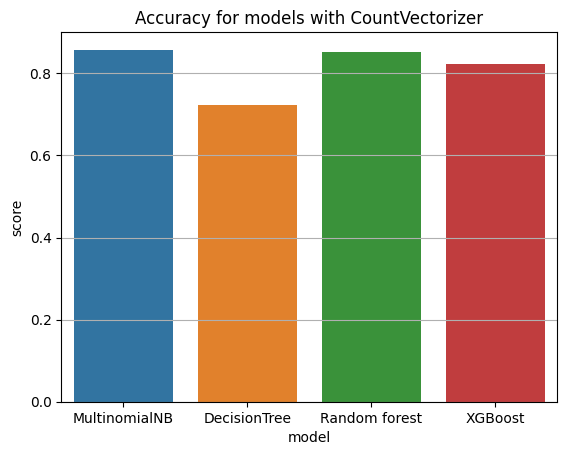

In [116]:
plt.grid()

sns.barplot(x = 'model', y = 'score', hue = 'model', data = df)
plt.title('Accuracy for models with CountVectorizer')
plt.show()

***************************************************************

## TfidfVectorizer

In [229]:
from sklearn.feature_extraction.text import TfidfVectorizer

TFidf_vectorizer = TfidfVectorizer()

X_train_tf = TFidf_vectorizer.fit_transform(X_train)
X_test_tf = TFidf_vectorizer.transform(X_test)

#### *** MultinomialNB ***
******************************************************************

In [230]:
Multitf = MultinomialNB()

In [231]:
Multitf.fit(X_train_tf, y_train)

MultinomialNB()

In [232]:
y_pred = Multitf.predict(X_test_tf)

In [233]:
multi_accuracy_TFidf = accuracy_score(y_pred, y_test)

print(multi_accuracy_TFidf)

0.8612964128382631


#### *** DecisionTree ***
******************************************************************

In [124]:
dectreetf = DecisionTreeClassifier()

In [125]:
dectreetf.fit(X_train_tf, y_train)

DecisionTreeClassifier()

In [126]:
y_pred = dectreetf.predict(X_test_tf)

In [127]:
dec_accuracy_TFidf = accuracy_score(y_pred, y_test)

print(dec_accuracy_TFidf)

0.718942731277533


#### *** Random forest ***
******************************************************************

In [128]:
RFtf = RandomForestClassifier()

In [129]:
RFtf.fit(X_train_tf, y_train)

RandomForestClassifier()

In [130]:
y_pred = RFtf.predict(X_test_tf)

In [131]:
RF_sccracy_TFidf = accuracy_score(y_pred, y_test)

print(RF_sccracy_TFidf)

0.8458149779735683


#### *** XGBoost ***
******************************************************************

In [134]:
dtrain2 = xgb.DMatrix(X_train_tf, y_train)
dtest2 = xgb.DMatrix(X_test_tf, y_test)

In [135]:
xgbtf = xgb.train(params, dtrain2, num_boost_round=100)

In [136]:
y_pred = xgbtf.predict(dtest2)

In [138]:
y_prdiction = [np.round(i) for i in y_pred]

In [139]:
xgb_accuracy_TFidf = accuracy_score(y_prediction, y_test)

print(xgb_accuracy_TFidf)

0.8216488357457521


*************************************************************

In [140]:
TFidf_scores = [multi_accuracy_TFidf, dec_accuracy_TFidf, RF_sccracy_TFidf, xgb_accuracy_TFidf]

In [141]:
TFidf_scores

[0.8612964128382631, 0.718942731277533, 0.8458149779735683, 0.8216488357457521]

In [142]:
df2 = {'model':models, 'score':TFidf_scores}

In [143]:
df2 = pd.DataFrame(df2)

In [144]:
df2

,model,score
0,MultinomialNB,0.861296
1,DecisionTree,0.718943
2,Random forest,0.845815
3,XGBoost,0.821649


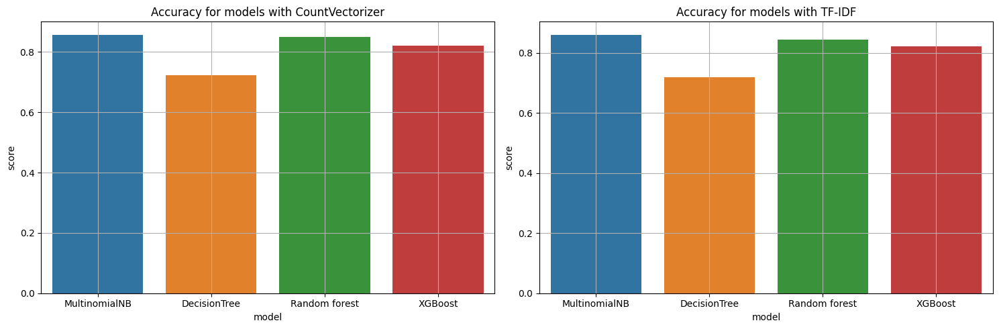

In [145]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.barplot(ax=axes[0], x='model', y='score', hue='model', data=df)
axes[0].set_title('Accuracy for models with CountVectorizer')
axes[0].grid(True)

sns.barplot(ax=axes[1], x='model', y='score', hue='model', data=df2)
axes[1].set_title('Accuracy for models with TF-IDF')
axes[1].grid(True)


plt.tight_layout()
plt.show()


##### The best model is * MultinomialNB * with TF-IDF feature extraction

***************************************************************

## Developed the Model

In [153]:
n = 50
acc_list = []
random = []
for i in range(n):

    random.append(i)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = i)

    Multitf.fit(X_train_tf, y_train)

    y_prd = Multitf.predict(X_test_tf)
    y_prediction = [np.round(i) for i in y_pred]
    acc_list.append(accuracy_score(y_prediction, y_test))

In [154]:
acc_df = {'random_state':random, 'accuracy':acc_list}

In [155]:
acc_df = pd.DataFrame(acc_df)

In [156]:
acc_df.iloc[acc_df['accuracy'].idxmax()]

random_state    42.000000
accuracy         0.817369
Name: 42, dtype: float64

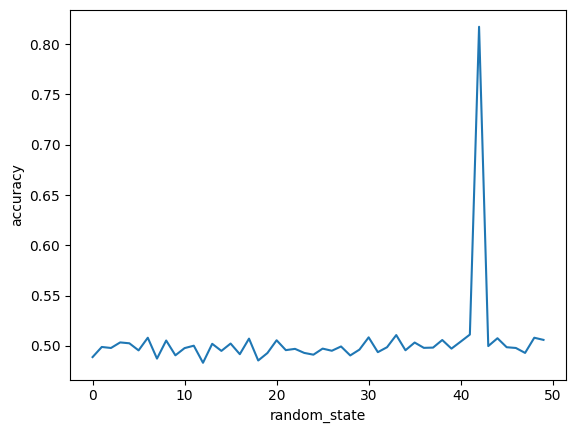

In [157]:
sns.lineplot(x = 'random_state', y = 'accuracy', data = acc_df)
plt.show()

In [242]:
X2 = TFidf_vectorizer.transform(train_df['text'])

In [244]:
from sklearn.model_selection import cross_val_score, KFold

num_folds = 5

kf_model = KFold(n_splits=num_folds, shuffle=True, random_state=42)

cross_val_results = cross_val_score(Multitf, X2, y, cv=kf_model)


In [245]:
print(f'Cross-Validation Results (Accuracy): {cross_val_results}')
print(f'Mean Accuracy: {cross_val_results.mean()}')


Cross-Validation Results (Accuracy): [0.86129641 0.86129641 0.8595343  0.86568479 0.85221551]
Mean Accuracy: 0.8600054852184297


In [246]:
Multitf.fit(X_train_tf, y_train)

MultinomialNB()

*******************************************************

In [247]:
def predict_df(data):


    data = data.applymap(lambda x: x.lower() if isinstance(x, str) else x)

    text = remove_strang(data['text'])

    tokenize_text = tokenization(text)

    filtered_text = stopword_removal(tokenize_text)

    stemm_text = Stemming(filtered_text)

    data['text'] = pd.DataFrame(make_df(stemm_text))

    Xx = TFidf_vectorizer.transform(data['text'])

    y_pred = Multitf.predict(Xx)

    return y_pred

**************************************************

In [248]:
val_data = pd.read_csv('Valid.csv')
val_data

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0
...,...,...
4995,"Man, I loved this movie! This really takes me ...",1
4996,Recovery is an incredibly moving piece of work...,1
4997,"You can take the crook out of the joint, but i...",1
4998,FUTZ is the only show preserved from the exper...,1


In [249]:
y_pred = predict_df(val_data)

In [250]:
y_pred

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [251]:
val_acc = accuracy_score(y_pred, val_data['label'])

print(val_acc)

0.8588


*********************************************************************************

In [275]:
stop_words = set(stopwords.words('english'))
stop_words.update(['film', 'move', 'br', 'one', 'character'])
stop_words.remove('not')
stop_words.remove('no')
stop_words = stop_words - negation_exceptions

def predict_smple(sample):

    sample = sample.lower()

    sample = re.sub("[^a-z\s\']", "", sample)

    pattern = r'\b\w*(\w)\1{2, }\w*\\b|\b\w{1}\b'

    sample = re.sub(pattern, '', sample)

    token_sample = word_tokenize(sample)

    filtered_sample = [word for word in token_sample if word not in stop_words]

    ps = PorterStemmer()
    stemm_text = [ps.stem(word) for word in filtered_sample]

    sample = ' '.join(stemm_text)

    sample = [sample]

    X3 = TFidf_vectorizer.transform(sample)

    y = Multitf.predict(X3)

    if y == 1:
        print('           Positive')
        img = Image.open('positive.png')

    elif y == 0:
        print('           Negative')
        img = Image.open('negative.png')


    return display(img)


           Positive


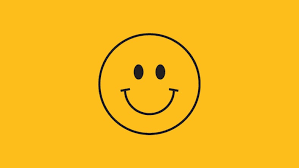

None


In [276]:
sample1 = "It was very good"
print(predict_smple(sample1))

           Negative


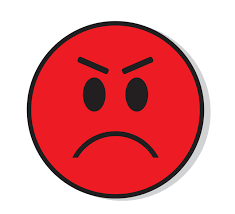

None


In [277]:
sample2 = "it wasnt good"
print(predict_smple(sample2))

*******************************************************************************************

# LSTM Model

In [179]:
import tensorflow as tf
import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

#### Read and preparation the trainning, valedation and testing data

In [280]:
train_df2 = pd.read_csv('Train.csv')

In [281]:
train_df2.drop_duplicates(inplace = True)

In [282]:
train_df2.reset_index(inplace = True)

In [283]:
train_df2.head()

,index,text,label
0,0,I grew up (b. 1965) watching and loving the Th...,0
1,1,"When I put this movie in my DVD player, and sa...",0
2,2,Why do people who do not know what a particula...,0
3,3,Even though I have great interest in Biblical ...,0
4,4,Im a die hard Dads Army fan and nothing will e...,1


In [284]:
train_df2.drop('index', axis = 1, inplace = True)

In [285]:
train_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    39723 non-null  object
 1   label   39723 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 620.8+ KB


In [286]:
def processing_df(data):


    data = data.applymap(lambda x: x.lower() if isinstance(x, str) else x)

    text = remove_strang(data['text'])

    tokenize_text = tokenization(text)

    filtered_text = stopword_removal(tokenize_text)

    stemm_text = Stemming(filtered_text)

    data['text'] = pd.DataFrame(make_df(stemm_text))

    return data

In [287]:
train_df2 = processing_df(train_df2)

In [288]:
train_df2.head()

,text,label
0,grew watch love thunderbird mate school watch ...,0
1,put dvd player sat coke chip expect hope would...,0
2,peopl not know particular time past like feel ...,0
3,even though great interest biblic movi bore de...,0
4,im die hard dad armi fan noth ever chang got t...,1


In [289]:
train_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    39723 non-null  object
 1   label   39723 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 620.8+ KB


In [290]:
train_df2['label'].value_counts()

label
1    19908
0    19815
Name: count, dtype: int64

In [291]:
val_df2 = pd.read_csv('Valid.csv')
val_df2.head()

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0


In [292]:
val_df2 = processing_df(val_df2)
val_df2.head()

,text,label
0,' year sinc sharon stone award viewer legcross...,0
1,someon need make car payment truli aw make jea...,0
2,guidelin state comment must contain minimum fo...,0
3,muddl mishmash clich recent cinema promis idea...,0
4,stan laurel becam smaller half alltim greatest...,0


In [293]:
val_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5000 non-null   object
 1   label   5000 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 78.3+ KB


In [294]:
val_df2['label'].value_counts()

label
1    2514
0    2486
Name: count, dtype: int64

#### Hyperparameters of the model

In [295]:
vocab_size = 3000 # the maximum number of unique words to consider.

oov_tok = ''    # This represents the out-of-vocabulary token.

embedding_dim = 100  #Each word will be represented by a vector of this size.

max_length = 200 # This defines the maximum length of input sequences. 
                   # Text sequences longer than this will be truncated, and shorter sequences will be padded.

padding_type='post'
trunc_type='post'

# tokenize sentences
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(train_df2['text'])
word_index = tokenizer.word_index

# convert train dataset to sequence and pad sequences
X_train = tokenizer.texts_to_sequences(train_df2['text'])
X_train = pad_sequences(X_train, padding='post', maxlen=max_length)

# convert Test dataset to sequence and pad sequences
X_val = tokenizer.texts_to_sequences(val_df2['text'])
X_val = pad_sequences(X_val, padding='post', maxlen=max_length)


y_train = train_df2['label']
y_val = val_df2['label']

In [296]:
# Define a Callback class that stops training once accuracy reaches 99.0%
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.95):
            print("\nReached 95.0% accuracy so cancelling training!")
            self.model.stop_training = True
callback = myCallback()


**********************************************************

In [297]:
model = keras.Sequential([
    
    keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    keras.layers.Bidirectional(keras.layers.LSTM(100, dropout=0.2, recurrent_dropout=0.2)),
    keras.layers.Dense(24, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])



model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)              │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_1 (Bidirectional)      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [298]:
history = model.fit(X_train, y_train, epochs=2, 
                              batch_size=15, 
                              callbacks=[callback])

Epoch 1/2
2649/2649 ━━━━━━━━━━━━━━━━━━━━ 427s 159ms/step - accuracy: 0.7085 - loss: 0.5523
Epoch 2/2
2649/2649 ━━━━━━━━━━━━━━━━━━━━ 395s 149ms/step - accuracy: 0.8641 - loss: 0.3240


In [299]:
model.evaluate(X_val, y_val)

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.8762 - loss: 0.2941


[0.29784032702445984, 0.8773999810218811]

******************************************************

In [197]:
model2 = tf.keras.Sequential([
    
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length = max_length),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),  # 1D Convolutional layer with 128 filters and kernel size 5
    tf.keras.layers.GlobalMaxPooling1D(),  # Global Max Pooling layer
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Adding Dropout with dropout rate of 0.5
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Adding Dropout with dropout rate of 0.5
    tf.keras.layers.Dense(1, activation='sigmoid')
    
])


model2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d (Conv1D)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d                 │ ?                           │     0 (unbuilt) │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [198]:
history = model2.fit(X_train, y_train, epochs=10, 
                              batch_size=32, 
                              callbacks=[callback])

Epoch 1/10
1242/1242 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - accuracy: 0.7043 - loss: 0.5325
Epoch 2/10
1242/1242 ━━━━━━━━━━━━━━━━━━━━ 84s 45ms/step - accuracy: 0.8947 - loss: 0.2734
Epoch 3/10
1242/1242 ━━━━━━━━━━━━━━━━━━━━ 91s 52ms/step - accuracy: 0.9362 - loss: 0.1774
Epoch 4/10
1242/1242 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.9663 - loss: 0.1027
Reached 95.0% accuracy so cancelling training!
1242/1242 ━━━━━━━━━━━━━━━━━━━━ 70s 42ms/step - accuracy: 0.9663 - loss: 0.1027


In [206]:
model2.evaluate(X_val, y_val)

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8635 - loss: 0.4504


[0.45909786224365234, 0.8637999892234802]

#### Try the best model on new sample
*********************************************************

In [200]:
def predict_sentiment(text):

    sequence = tokenizer.texts_to_sequences([text])
    padded_sequence = pad_sequences(sequence, maxlen = 200)

    prediction = model2.predict(padded_sequence)
    
    if prediction >= 0.5:
        print('           Positive')
        img = Image.open('positive.png')

    else:
        print('           Negative')
        img = Image.open('negative.png') 


    return display(img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
           Positive


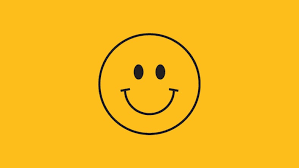

In [201]:
sample1 = 'It was a good filme'
predict_sentiment(sample1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
           Negative


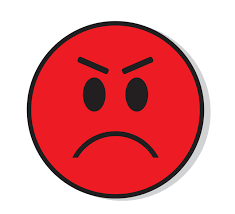

In [221]:
sample3 = "I really dont like it"
predict_sentiment(sample3)

*******************************************************

In [211]:
stop_words = set(stopwords.words('english'))
stop_words.update(['br', 'one', 'character', 'film', 'movie'])
stop_words.remove('not')
stop_words.remove('no')
stop_words = stop_words - negation_exceptions


def predict_sentiment1(sample):


    sample = sample.lower()

    sample = re.sub("[^a-z\s\']", "", sample)

    pattern = r'\b\w*(\w)\1{2, }\w*\\b|\b\w{1}\b'

    sample = re.sub(pattern, '', sample)

    token_sample = word_tokenize(sample)

    filtered_sample = [word for word in token_sample if word not in stop_words]

    ps = PorterStemmer()
    stemm_text = [ps.stem(word) for word in filtered_sample]

    sample = ' '.join(stemm_text)

    sample = [sample]

    text = sample

    sequence = tokenizer.texts_to_sequences([text])
    padded_sequence = pad_sequences(sequence, maxlen = 200)

    prediction = model2.predict(padded_sequence)

    if prediction >= 0.5:
        print('           Positive')
        img = Image.open('positive.png')

    else:
        print('           Negative')
        img = Image.open('negative.png') 


        


    return display(img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
           Negative


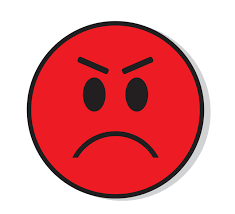

In [301]:
sample3 = "i dont like it "
predict_sentiment1(sample3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
           Positive


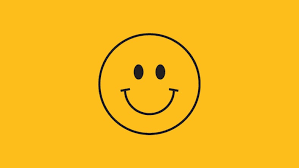

In [302]:
predict_sentiment1("I love it")

**********************************************************

#### Save the model for deploying

In [ ]:
model2.save('model1.h5')

In [ ]:
import pickle

# Assume `tokenizer` is your trained tokenizer
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)


                                                                        :)